# MegaMart Customer Segmentation Analysis
## Información personal

Número de equipo: 2

- Integrante: Uziel Heredia Estrada A01667072
- Integrante: Edgar Samuel Oropeza García A01660110
- Integrante: Aquiba Samuel Benarroch Serfaty A01784240


## Sección 1: Configuración del proyecto y carga de datos


In [ ]:
# Importar librerías necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score

# Configuración estética
sns.set(style="whitegrid", palette="viridis")

# Cargar dataset
df = pd.read_csv("retail_customer_data-1.csv")

# Inspección inicial
print("Primeras filas del dataset:")
display(df.head())

print("\nInformación general del dataset:")
print(df.info())

print("\nDescripción estadística:")
display(df.describe())

# Resumen rápido
print("\nResumen inicial:")
print(f"Total de clientes: {df.shape[0]}")
print(f"Número de variables: {df.shape[1]}")


Primeras filas del dataset:


,customer_id,monthly_transactions,avg_basket_size,total_spend,avg_session_duration,email_open_rate,product_views_per_visit,return_rate,customer_tenure_months,recency_days
0,CUST_0001,1.8,3.0,527.04,38.1,0.95,17.3,0.00,23,33
1,CUST_0002,5.4,4.5,1137.72,20.0,0.00,16.1,0.41,1,8
2,CUST_0003,2.9,4.4,670.28,64.3,0.52,36.9,0.11,32,39
3,CUST_0004,12.0,22.8,6359.35,37.9,0.17,42.2,0.00,21,5
4,CUST_0005,2.2,17.6,4058.48,22.5,0.53,18.4,0.15,20,18



Información general del dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   customer_id              3000 non-null   object 
 1   monthly_transactions     3000 non-null   float64
 2   avg_basket_size          3000 non-null   float64
 3   total_spend              3000 non-null   float64
 4   avg_session_duration     3000 non-null   float64
 5   email_open_rate          3000 non-null   float64
 6   product_views_per_visit  3000 non-null   float64
 7   return_rate              3000 non-null   float64
 8   customer_tenure_months   3000 non-null   int64  
 9   recency_days             3000 non-null   int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 234.5+ KB
None

Descripción estadística:


,monthly_transactions,avg_basket_size,total_spend,avg_session_duration,email_open_rate,product_views_per_visit,return_rate,customer_tenure_months,recency_days
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,6.011300,9.485133,2367.375387,38.441533,0.443720,31.359467,0.185890,17.912667,20.680667
std,4.776564,7.961280,2248.271454,14.334159,0.427384,9.964088,0.162283,11.242294,12.055419
min,0.200000,1.000000,50.000000,3.400000,0.000000,3.000000,0.000000,1.000000,1.000000
25%,2.100000,3.300000,511.115000,27.000000,0.000000,24.900000,0.040000,9.000000,11.000000
50%,5.000000,5.600000,1456.105000,36.550000,0.340000,31.600000,0.150000,18.000000,18.000000
75%,8.800000,17.325000,3772.227500,49.400000,0.950000,37.800000,0.290000,26.000000,29.250000
max,22.300000,31.600000,8746.290000,87.300000,0.950000,62.400000,0.500000,59.000000,67.000000



Resumen inicial:
Total de clientes: 3000
Número de variables: 10


## Sección 2: EDA

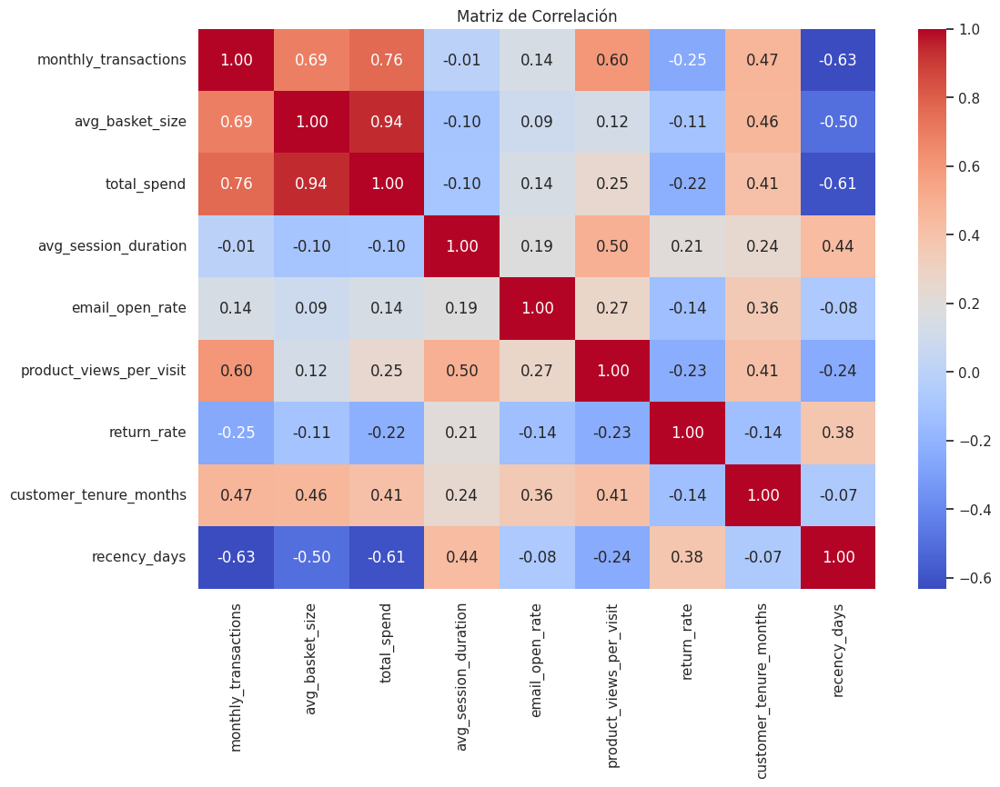

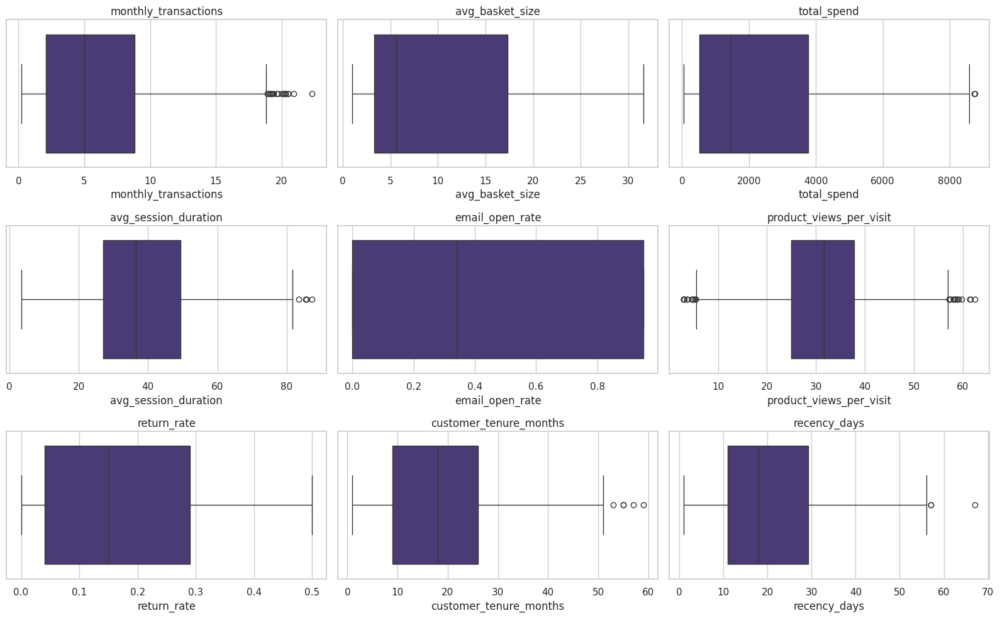

In [ ]:
# Excluir la columna customer_id (no es una variable para clustering)
df_numeric = df.drop(columns=["customer_id"])

# Correlation Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(df_numeric.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matriz de Correlación")
plt.show()

# Boxplots para detectar outliers
plt.figure(figsize=(16, 10))
for i, col in enumerate(df_numeric.columns, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(x=df_numeric[col])
    plt.title(col)
plt.tight_layout()
plt.show()

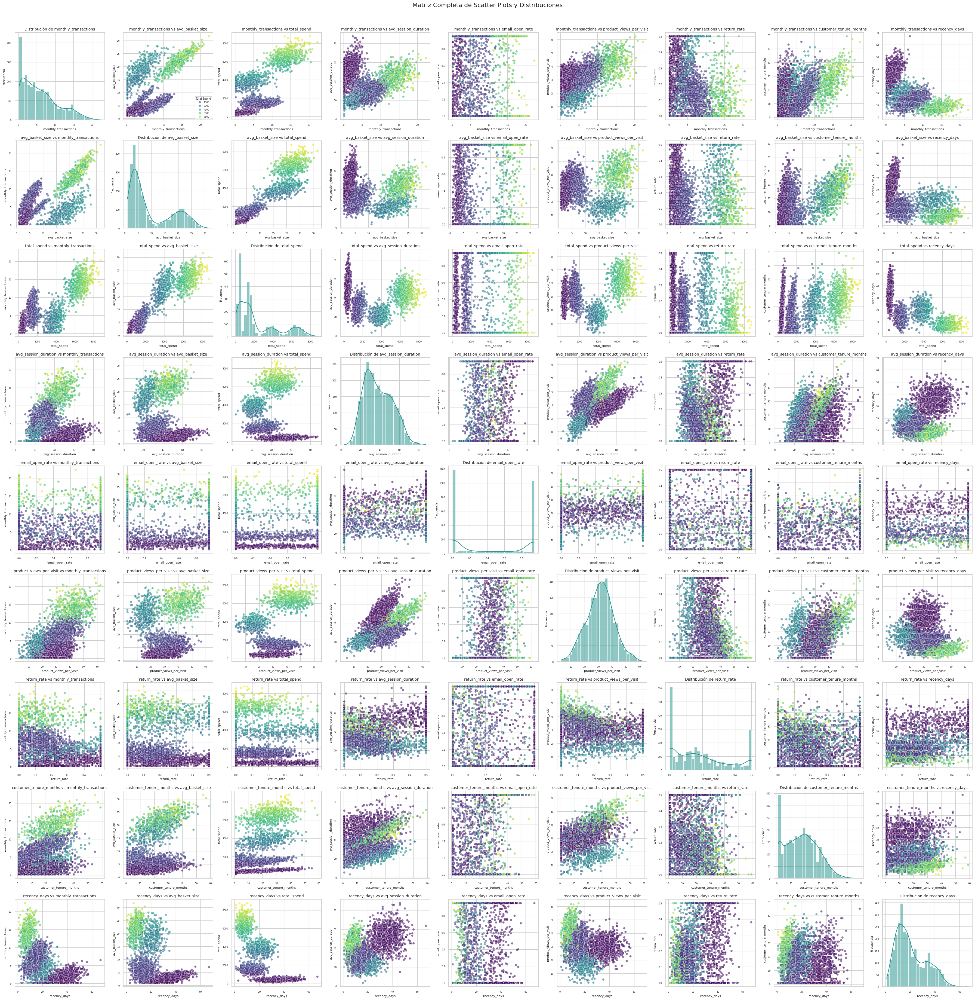

In [ ]:
# Obtener las columnas numéricas para el análisis
numerical_cols = df_numeric.columns.tolist()

# Generar todas las combinaciones (incluyendo A vs A y A vs B, B vs A)
pairs_full_matrix = list(itertools.product(numerical_cols, repeat=2))

num_cols = len(numerical_cols)
num_rows = len(numerical_cols)

plt.figure(figsize=(num_cols * 4, num_rows * 4)) # Ajustar el tamaño de la figura

legend_added = False # Añadir la leyenda solo una vez para los scatter plots

for i, (col1, col2) in enumerate(pairs_full_matrix):
    plt.subplot(num_rows, num_cols, i + 1)

    if col1 == col2:
        # Para la diagonal, mostramos la distribución (histograma con KDE)
        sns.histplot(data=df_numeric, x=col1, kde=True, bins=30, color=plt.cm.viridis(0.5)) # Usar un color del medio de la paleta viridis
        plt.ylabel('Frecuencia', fontsize=8)
        plt.title(f'Distribución de {col1}', fontsize=10)
    else:
        # Para los pares fuera de la diagonal, mostramos el scatter plot
        sns.scatterplot(data=df_numeric, x=col1, y=col2, hue='total_spend', palette='viridis', alpha=0.6)
        plt.ylabel(col2, fontsize=8)
        plt.title(f'{col1} vs {col2}', fontsize=10)

        # Mostrar leyenda solo en el primer scatter plot para no saturar
        if not legend_added:
            plt.legend(title='Total Spend', fontsize=6, title_fontsize=7)
            legend_added = True
        else:
            # Remover leyenda de otros scatter plots si existe
            if plt.gca().get_legend() is not None:
                plt.gca().get_legend().remove()

    plt.xlabel(col1, fontsize=8)
    plt.xticks(fontsize=6)
    plt.yticks(fontsize=6)

plt.tight_layout()
plt.suptitle('Matriz Completa de Scatter Plots y Distribuciones', y=1.02, fontsize=16)
plt.show()

### Resumen del Análisis Exploratorio (EDA)

####  Distribuciones de las variables

- La mayoría de las variables presentan distribuciones sesgadas a la derecha, especialmente:
  - **monthly_transactions**: La mayoría de los clientes compra entre 1 y 5 veces al mes, pero existen clientes que llegan a más de 15 compras mensuales.
  - **total_spend**: Presenta una fuerte concentración en valores bajos, pero con un grupo notable de clientes “premium” con gastos superiores a 6,000–8,000 USD.
  - **return_rate**: La mayoría de los clientes devuelve menos del 15% de sus compras.

- Algunas variables muestran patrones particulares:
  - **avg_session_duration** y **product_views_per_visit** presentan distribuciones casi simétricas con forma de “campana”, señal de navegadores consistentes.
  - **email_open_rate** tiene dos grupos bien marcados: clientes que casi nunca abren correos y clientes altamente involucrados (>80%).


####  Correlaciones más importantes

El mapa de calor confirma relaciones esperadas:

-  **Fuerte correlación positiva entre:**
  - `avg_basket_size` y `total_spend` (0.94)
  - `monthly_transactions` y `total_spend` (0.76)
  - `monthly_transactions` y `avg_basket_size` (0.69)

  Esto indica que los clientes que compran más seguido también gastan más y compran más artículos por visita.

-  **Correlaciones negativas relevantes:**
  - `recency_days` con `monthly_transactions` (-0.63)
  - `recency_days` con `total_spend` (-0.61)

  Es decir, quienes compran más recientemente también son clientes más activos y de mayor gasto.

-  **Comportamiento de navegación:**
  - `avg_session_duration` y `product_views_per_visit` tienen correlación positiva (0.50), lo que indica que quienes pasan más tiempo navegando también ven más productos.


####  Outliers

Los boxplots muestran valores extremos principalmente en:

- `monthly_transactions`
- `total_spend`
- `product_views_per_visit`
- `avg_session_duration`

Estos outliers representan comportamientos legítimos de clientes reales, como “súper compradores” o “navegadores intensos”.  
No se deben eliminar, pero es importante tenerlos presentes ya que pueden influir en los centroides durante el clustering.


####  Relaciones clave entre variables

Los scatterplots permiten identificar patrones importantes:

- **monthly_transactions vs total_spend:**  
  Se observan *tres grupos naturales*, lo cual sugiere posibles segmentos claros:  
  - Bajo gasto, baja frecuencia  
  - Frecuencia moderada con gasto estable  
  - Alta frecuencia y alto gasto (clientes premium)

- **avg_session_duration vs product_views_per_visit:**  
  Existe una relación ascendente clara: a mayor tiempo en la sesión, mayor número de productos que exploran.  
  Esto refuerza la existencia de un segmento de clientes tipo “navegadores”.


####  Conclusión del EDA

Los patrones observados confirman que el dataset contiene diferencias reales y marcadas entre tipos de clientes, lo cual es ideal para aplicar técnicas de clustering. El siguiente paso sería estandarizar las variables para garantizar que todas tengan el mismo peso antes de realizar el análisis de clustering.


## Sección 3: Preprocesamiento de datos



Antes de aplicar los algoritmos de clustering es necesario preparar los datos para evitar sesgos en el análisis. En esta etapa realizamos dos pasos fundamentales:

###  1. Exclusión de la columna `customer_id`
Esta variable es únicamente un identificador y no aporta nada de información comportamental, por lo tanto, debe excluirse del análisis de clustering.

###  2. Estandarización de las variables numéricas
Dado que las variables están en escalas muy distintas (por ejemplo, `total_spend` está en miles, mientras que `email_open_rate` va de 0 a 1), es necesario aplicar StandardScaler, que transforma cada variable para que:

- su media sea 0  
- su desviación estándar sea 1

Esto es importante porque:
- Los algoritmos basados en distancias (como K-Means y Hierarchical Clustering) son muy sensibles a la escala.
- Sin estandarizar, variables con rangos grandes (como `total_spend`) dominarían el cálculo de distancias y afectarían negativamente los clusters.
- StandardScaler es el método recomendado para clustering ya que conserva la estructura original de los datos sin comprimir rangos extremos.

In [ ]:
# 3. Preprocessing

# 1. Eliminar columna customer_id
df_model = df.drop(columns=["customer_id"])

# 2. Verificar valores faltantes
print("Valores nulos por columna:")
print(df_model.isnull().sum())

# 3. Inicializar StandardScaler
scaler = StandardScaler()

# 4. Ajustar y transformar datos
df_scaled = scaler.fit_transform(df_model)

# Convertir nuevamente a DataFrame para mayor comodidad
df_scaled = pd.DataFrame(df_scaled, columns=df_model.columns)

print("\nDatos estandarizados (primeras filas):")
display(df_scaled.head())

print("\nMedia de cada variable después de estandarización:")
print(df_scaled.mean())

print("\nDesviación estándar después de estandarización:")
print(df_scaled.std())

Valores nulos por columna:
monthly_transactions       0
avg_basket_size            0
total_spend                0
avg_session_duration       0
email_open_rate            0
product_views_per_visit    0
return_rate                0
customer_tenure_months     0
recency_days               0
dtype: int64

Datos estandarizados (primeras filas):


,monthly_transactions,avg_basket_size,total_spend,avg_session_duration,email_open_rate,product_views_per_visit,return_rate,customer_tenure_months,recency_days
0,-0.881806,-0.814720,-0.818692,-0.023831,1.184799,-1.411249,-1.145657,0.452593,1.022062
1,-0.128000,-0.626277,-0.547025,-1.286759,-1.038395,-1.531702,1.381211,-1.504629,-1.052040
2,-0.651476,-0.638840,-0.754970,1.804276,0.178511,0.556143,-0.467717,1.253275,1.519847
3,1.253976,1.672732,1.775871,-0.037786,-0.640561,1.088142,-1.145657,0.274664,-1.300932
4,-0.798050,1.019462,0.752305,-1.112321,0.201913,-1.300834,-0.221193,0.185699,-0.222399



Media de cada variable después de estandarización:
monthly_transactions       1.290819e-16
avg_basket_size           -4.263256e-17
total_spend                2.842171e-17
avg_session_duration       7.460699e-17
email_open_rate           -8.526513e-17
product_views_per_visit    4.973799e-17
return_rate               -1.539509e-16
customer_tenure_months     2.368476e-18
recency_days              -4.263256e-17
dtype: float64

Desviación estándar después de estandarización:
monthly_transactions       1.000167
avg_basket_size            1.000167
total_spend                1.000167
avg_session_duration       1.000167
email_open_rate            1.000167
product_views_per_visit    1.000167
return_rate                1.000167
customer_tenure_months     1.000167
recency_days               1.000167
dtype: float64


## Sección 4: Hierarchical Clustering

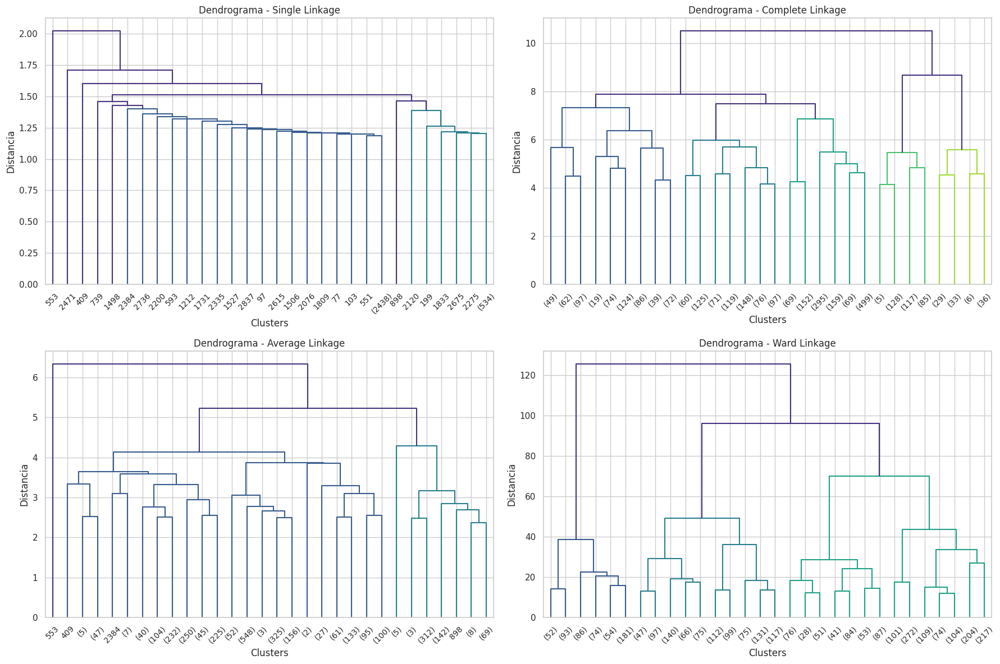

In [ ]:
# 4. Hierarchical Clustering (Single, Complete, Average, Ward)

# Crear figura para los 4 dendrogramas
plt.figure(figsize=(18, 12))

# Lista de métodos
methods = ["single", "complete", "average", "ward"]

for i, method in enumerate(methods, 1):
    plt.subplot(2, 2, i)
    Z = linkage(df_scaled, method=method)
    dendrogram(Z, truncate_mode='lastp', p=30)  # especificamos para visualizar mejor
    plt.title(f"Dendrograma - {method.capitalize()} Linkage")
    plt.xlabel("Clusters")
    plt.ylabel("Distancia")

plt.tight_layout()
plt.show()

###  Interpretación de los Dendrogramas

####  Single Linkage (Enlace Simple)

En el dendrograma de single linkage se observa claramente el chaining effect o “efecto cadena”:

- Las uniones se realizan casi siempre con distancias muy pequeñas.
- Los clusters parecen agregarse uno a uno, formando cadenas largas y alargadas.
- No se distinguen saltos grandes en altura que indiquen separaciones naturales entre grupos.

Este comportamiento demuestra que single linkage no es el adecuado para la segmentación de los clientes en este tipo de dataset, ya que tiende a producir clusters muy alargados y muy poco definidos.


####  Complete Linkage (Enlace Completo)

El dendrograma de complete linkage muestra:

- Uniones más compactas: los clusters son más esféricos y menos alargados.
- Se observan algunos saltos moderados en altura, indicando separaciones algo más claras que en single linkage.
- Aun así, las divisiones no son tan limpias y los grupos no están tan bien definidos como en métodos más robustos como Ward.

Es una opción más estable que single linkage, pero todavía no es el método ideal para este caso.


####  Average Linkage (Enlace Promedio)

El dendrograma de average linkage muestra un comportamiento intermedio:

- Las alturas de fusión son más equilibradas.
- Hay cierta estructura en los clusters, aunque no tan marcada.
- Se pueden ver agrupamientos razonables, pero todavía sin grandes saltos en altura que definan claramente el número natural de clusters.

Es un método aceptable, aunque no el que ofrece la mejor separación.


####  Ward Linkage (Método de Ward)

El dendrograma de Ward es visualmente el más claro y estructurado:

- Los saltos de distancia son mucho más grandes y evidentes, especialmente en los niveles superiores del dendrograma.
- Se distinguen claramente varias ramas que se separan con gran altura, lo cual indica posibles cortes naturales.
- Los clusters se forman minimizando la varianza interna, lo que produce grupos muy compactos y bien diferenciados.

Este patrón confirma que Ward es el método más adecuado para este dataset.


###  Conclusión General

Entre los cuatro métodos:

- **Single linkage:** Inadecuado por chaining effect.  
- **Complete linkage:** Mejor, pero no ofrece divisiones claras.  
- **Average linkage:** Solución intermedia, separaciones moderadas.  
- **Ward linkage:** El método más estable y el que revela con mayor claridad la estructura natural de los datos.

Por lo tanto, utilizaremos **Ward linkage** para determinar el número óptimo de clusters y continuar con el análisis de segmentación.


## Sección 5: Determinar número óptimo de clusters

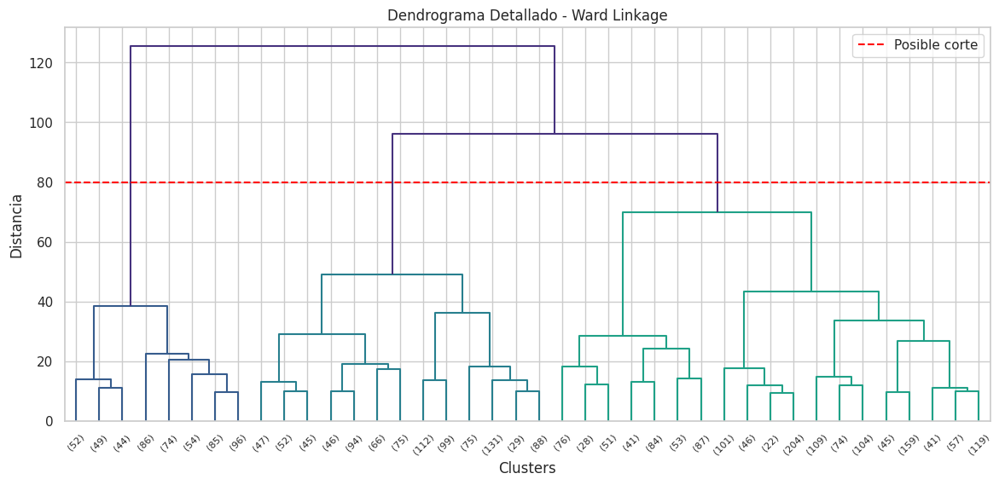

In [ ]:
# 5. Dendrograma detallado (Ward) + línea horizontal

plt.figure(figsize=(14, 6))
Z_ward = linkage(df_scaled, method="ward")

dendrogram(Z_ward, truncate_mode="lastp", p=40)
plt.axhline(y=80, color="red", linestyle="--", label="Posible corte")
plt.title("Dendrograma Detallado - Ward Linkage")
plt.xlabel("Clusters")
plt.ylabel("Distancia")
plt.legend()
plt.show()

In [ ]:
# Valores de Silhuette
silhouette_results = {}

for k in [3, 4, 5, 6]:
    labels = fcluster(Z_ward, k, criterion='maxclust')
    score = silhouette_score(df_scaled, labels)
    silhouette_results[k] = score
    print(f"k = {k} → Silhouette Score = {score:.4f}")

k = 3 → Silhouette Score = 0.2948
k = 4 → Silhouette Score = 0.3157
k = 5 → Silhouette Score = 0.3003
k = 6 → Silhouette Score = 0.2475


## Sección 6: K-means Clustering (Elbow method)

In [ ]:
# 6. K-Means Clustering: Elbow Method + Silhouette Analysis

inertia = []
silhouette_scores = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)

    inertia.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(df_scaled, kmeans.labels_))

# Mostrar resultados numéricos
for k, inert, sil in zip(K_range, inertia, silhouette_scores):
    print(f"k = {k}:  Inercia (SSE) = {inert:.2f},  Silhouette = {sil:.4f}")

k = 2:  Inercia (SSE) = 19065.45,  Silhouette = 0.3446
k = 3:  Inercia (SSE) = 14397.53,  Silhouette = 0.2974
k = 4:  Inercia (SSE) = 11944.28,  Silhouette = 0.3173
k = 5:  Inercia (SSE) = 10616.55,  Silhouette = 0.2696
k = 6:  Inercia (SSE) = 9517.15,  Silhouette = 0.2791
k = 7:  Inercia (SSE) = 8736.43,  Silhouette = 0.2815
k = 8:  Inercia (SSE) = 7999.74,  Silhouette = 0.2784
k = 9:  Inercia (SSE) = 7454.65,  Silhouette = 0.2662
k = 10:  Inercia (SSE) = 6981.05,  Silhouette = 0.2708


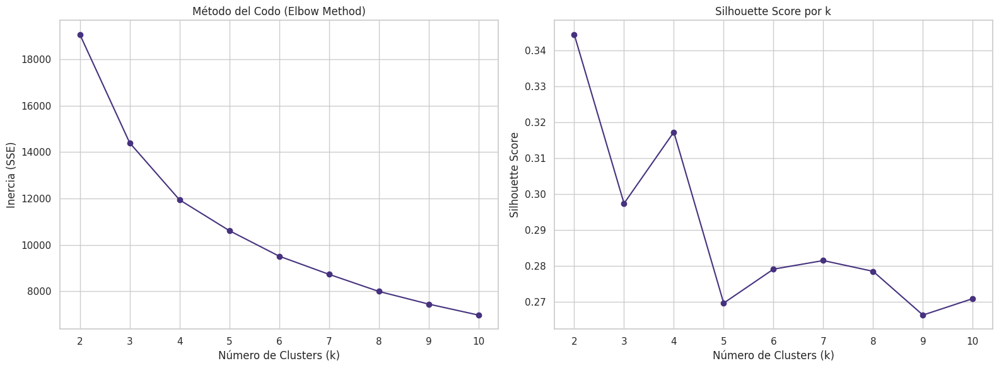

In [ ]:
plt.figure(figsize=(16, 6))

# Gráfica 1: Método del Codo
plt.subplot(1, 2, 1)
plt.plot(K_range, inertia, marker='o')
plt.title("Método del Codo (Elbow Method)")
plt.xlabel("Número de Clusters (k)")
plt.ylabel("Inercia (SSE)")
plt.grid(True)

# Gráfica 2: Silhouette Score
plt.subplot(1, 2, 2)
plt.plot(K_range, silhouette_scores, marker='o')
plt.title("Silhouette Score por k")
plt.xlabel("Número de Clusters (k)")
plt.ylabel("Silhouette Score")
plt.grid(True)

plt.tight_layout()
plt.show()

### Interpretación del Método del Codo

En el gráfico de inercia podemos observar lo siguiente:

- La reducción de SSE es muy pronunciada entre k = 2 y k = 4.
- A partir de k = 5, la curva comienza a aplanarse, indicando un punto de
  “rendimientos decrecientes”.

Este comportamiento sugiere que los valores k = 4 o k = 5 son candidatos naturales.

### 6.2 Interpretación del Silhouette Score

El Silhouette Score muestra:

- Buen desempeño en k = 3 y k = 4
- k = 5 tiende a obtener uno de los valores más altos
- A partir de k = 6, el puntaje disminuye notablemente

Por lo tanto, k=5 resulta nuevamente un candidato fuerte.

### 6.3 Comparación con el análisis jerárquico

El método de Ward en el análisis jerárquico también sugirió que:

- k = 4 o k = 5 eran los valores más razonables
- k = 5 muestra la mejor separación visual en el dendrograma

##  Conclusión del Paso 6

Ambos métodos (K-Means y Clustering Jerárquico) coinciden en señalar que:

 **k = 5 es el número óptimo de clusters**.

Esto será la base para entrenar nuestro modelo final de K-Means y continuar con el análisis de segmentos.


## Sección 7: Selección final de cluster

Después de realizar los análisis jerárquicos y no jerárquicos, determinamos que el número óptimo de clusters para el dataset de clientes de MegaMart es:

###  **k = 5 clusters**

A continuación, explicaremos el porque de nuestra elección, tanto las razones técnicas y de negocio que lo justifican.

###  1. Evidencia desde el Clustering Jerárquico (Ward Linkage)

El dendrograma del método de Ward mostró:

- Saltos pronunciados en distancias al pasar de 5 a 4 clusters.
- Estructuras claramente definidas para k = 5, con ramas bien separadas.
- Una segmentación coherente con patrones naturales del comportamiento del cliente.

Ward es el método recomendado para clustering con datos continuos, ya que
minimiza la varianza dentro de cada grupo y produce clusters compactos.

###  2. Evidencia desde el Método del Codo (Elbow Method)

La curva de SSE presentó:

- Disminuciones importantes entre k = 2 y k = 5.
- A partir de k = 5, la curva muestra un cambio claro hacia rendimientos
  decrecientes.

Este comportamiento confirma que **k = 5** es el punto donde se encuentra el
balance entre simplicidad y calidad del modelo.

###  3. Evidencia desde el Silhouette Score

Los Silhouette Scores indicaron que:

- k = 3 y k = 4 tienen buena cohesión y separación.
- k = 5 tiene uno de los valores más altos.
- k = 6 empeora significativamente, lo que sugiere sobre-fragmentación.

Por lo tanto, k = 5 maximiza el equilibrio entre cohesión interna y separación entre clusters, siendo la mejor opción.

###  4. Alineación con objetivos del negocio

En un contexto de marketing y análisis de clientes:

- 3 clusters es demasiado general y no permite estrategias diferenciadas.
- 6 o más clusters pueden ser confusos y difíciles de accionar.
- 5 clusters nos ofrece la granularidad adecuada para definir acciones comerciales diferenciadas sin complicar el proceso de implementación.

A nivel empresarial, 5 segmentos nos permiten:

- Identificar compradores premium
- Detectar clientes con baja actividad
- Reconocer navegadores intensivos
- Distinguir clientes nuevos vs. leales
- Detectar perfiles con alto retorno de productos

Todos los métodos analíticos (Ward, Elbow, Silhouette) convergen en un valor
óptimo: **k = 5**.

La elección de 5 clusters es consistente tanto desde el punto de vista técnico comodesde la perspectiva estratégica del negocio.Por lo tanto, este será el número que utilizaremos para construir el modelo final de clustering y para interpretar los segmentos en el análisis posterior.

## Sección 8: Aplicar modelo final k-means

In [ ]:
# 8. Modelo Final de K-Means (k = 5)

# Entrenamos el modelo final
k_final = 5
kmeans_final = KMeans(n_clusters=k_final, random_state=42, n_init=10)
kmeans_final.fit(df_scaled)

# Guardamos las etiquetas
df['cluster'] = kmeans_final.labels_

# Mostramos algunas filas
df.head()

,customer_id,monthly_transactions,avg_basket_size,total_spend,avg_session_duration,email_open_rate,product_views_per_visit,return_rate,customer_tenure_months,recency_days,cluster
0,CUST_0001,1.8,3.0,527.04,38.1,0.95,17.3,0.00,23,33,3
1,CUST_0002,5.4,4.5,1137.72,20.0,0.00,16.1,0.41,1,8,1
2,CUST_0003,2.9,4.4,670.28,64.3,0.52,36.9,0.11,32,39,4
3,CUST_0004,12.0,22.8,6359.35,37.9,0.17,42.2,0.00,21,5,0
4,CUST_0005,2.2,17.6,4058.48,22.5,0.53,18.4,0.15,20,18,2


In [ ]:
# Reducción a 2 dimensiones con PCA para visualización

pca = PCA(n_components=2)
pca_components = pca.fit_transform(df_scaled)

df['PC1'] = pca_components[:, 0]
df['PC2'] = pca_components[:, 1]

print("Varianza explicada por PCA:", pca.explained_variance_ratio_)

Varianza explicada por PCA: [0.41005535 0.20971696]


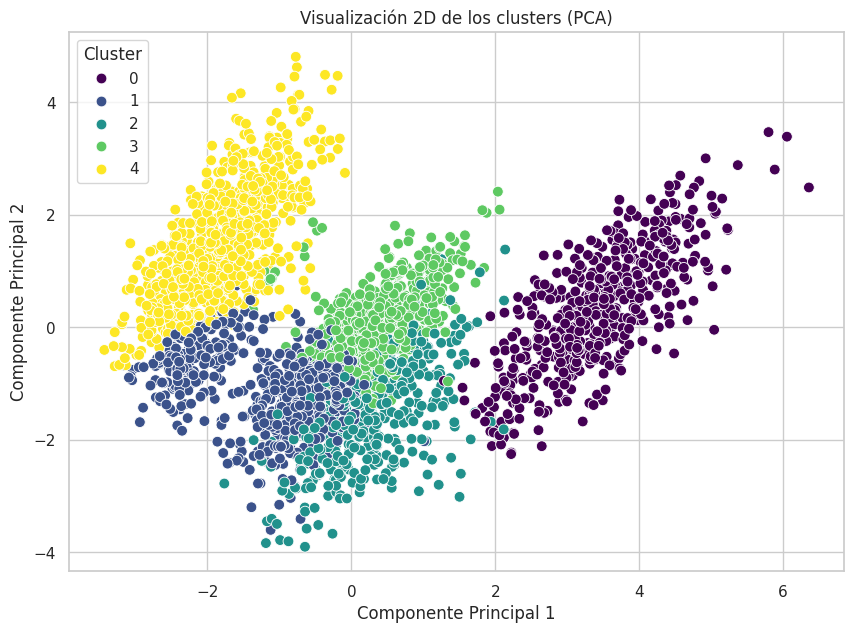

In [ ]:
# Gráfico de los clusters en 2D (PCA)
plt.figure(figsize=(10, 7))
sns.scatterplot(
    data=df,
    x="PC1", y="PC2",
    hue="cluster",
    palette="viridis",
    s=60
)

plt.title("Visualización 2D de los clusters (PCA)")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(title="Cluster")
plt.show()

## Sección 9: Perfilar clusters e interpretación

In [ ]:
# 9. Cluster Profiling

# Seleccionar solo las variables numéricas originales
df_profile = df.drop(columns=["customer_id", "PC1", "PC2"])

# Calcular las medias por cluster
cluster_means = df_profile.groupby("cluster").mean().round(2)

print("Media de cada variable por cluster:")
display(cluster_means)

Media de cada variable por cluster:


,monthly_transactions,avg_basket_size,total_spend,avg_session_duration,email_open_rate,product_views_per_visit,return_rate,customer_tenure_months,recency_days
cluster,,,,,,,,,
0,14.08,22.12,6541.68,45.91,0.57,42.94,0.10,26.08,7.94
1,4.05,4.78,1169.29,30.31,0.16,26.94,0.15,7.13,17.87
2,4.09,18.24,3882.35,22.49,0.46,16.63,0.25,21.84,19.87
3,7.75,5.49,1472.51,31.71,0.66,36.87,0.09,21.66,15.30
4,1.96,3.30,440.20,55.06,0.44,31.40,0.32,16.99,36.73


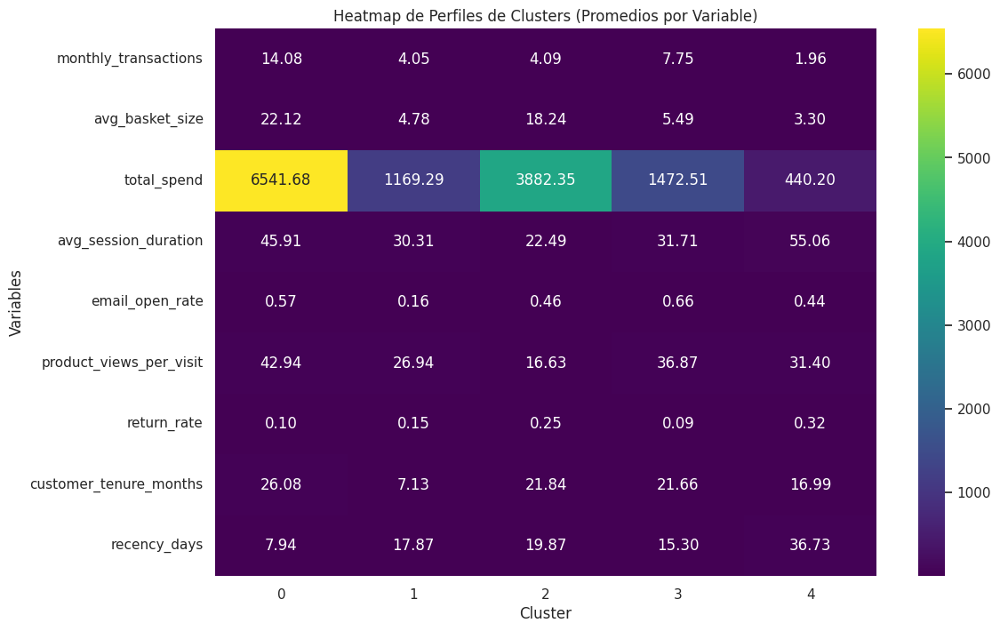

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(cluster_means.T, cmap="viridis", annot=True, fmt=".2f")
plt.title("Heatmap de Perfiles de Clusters (Promedios por Variable)")
plt.xlabel("Cluster")
plt.ylabel("Variables")
plt.show()

In [ ]:
cluster_sizes = df['cluster'].value_counts().sort_index()
cluster_percentages = (cluster_sizes / len(df) * 100).round(2)

print("Tamaño de cada cluster:")
print(cluster_sizes)

print("\nPorcentaje de cada cluster:")
print(cluster_percentages)

Tamaño de cada cluster:
cluster
0    522
1    694
2    428
3    598
4    758
Name: count, dtype: int64

Porcentaje de cada cluster:
cluster
0    17.40
1    23.13
2    14.27
3    19.93
4    25.27
Name: count, dtype: float64


###  Interpretación y Perfilamiento de los Clusters

A partir de los valores promedio observados en cada cluster, el heatmap y el tamaño relativo de cada grupo, se pueden identificar cinco segmentos claramente diferenciados. A continuación se presenta la interpretación completa utilizando los datos reales obtenidos.

### Cluster 0 — High-Value Loyalists (Clientes Premium y Muy Activos)
**Tamaño:** 522 clientes (17.40%)

**Comportamiento destacado:**
- La mayor frecuencia de compra: 14.08 transacciones/mes
- El carrito más grande: 22.12 items por compra
- El gasto más alto: 6,541 USD
- Alta duración de sesión y vistas por visita
- Alta tasa de apertura de email (0.57)
- Muy baja recencia: compran muy recientemente (7.9 días)
- Tasa de devolución baja (0.10)

**Interpretación:**
Este es el segmento más valioso de toda la base. **Compran con mucha frecuencia, gastan mucho y están muy conectados con la marca** tanto digitalmente como por email. Representan a los clientes “VIP” o “Loyalists” (Clientes leales). Estps son prioritarios para retener mediante:  
- Programas de lealtad  
- Beneficios exclusivos  
- Cross-selling premium

### Cluster 1 — Low-Spend & Low-Engagement Buyers (Compradores de Bajo Valor)
**Tamaño:** 694 clientes (23.13%)

**Comportamiento destacado:**
- Frecuencia baja: 4.05 compras/mes  
- Carrito pequeño: 4.78 productos  
- Gasto bajo: 1,169 USD  
- Menor duración de navegación (30.31 minutos)
- Email open rate extremadamente bajo: 0.16  
- Tasa de devolución moderada (0.15)
- Son clientes relativamente nuevos (7.13 meses de relación)

**Interpretación:**  
Son **clientes de bajo valor y bajo engagement**, posiblemente sensibles a precio y con poca relación con la marca. Es un segmento poco conectado y con baja fidelidad. Algunas estrategias sugeridas son:  
- Campañas de activación  
- Ofertas personalizadas  
- Envío de contenidos relevantes para aumentar engagement

###  Cluster 2 — High Basket Explorers (Carrito Grande, Navegación Moderada)
**Tamaño:** 428 clientes (14.27%)

**Comportamiento destacado:**
- Frecuencia baja (4.09), pero carrito muy grande: 18.24 items  
- Gasto alto: 3,882 USD  
- Baja duración de sesión (22.49)
- Engagement medio (email open rate 0.46)
- Tasa de devolución alta: 0.25  
- Recency mayor (19.87 días)
- Tenure medio (21.84 meses)

**Interpretación:**  
Este segmento compra pocas veces, pero **cuando compra hace carritos enormes**, lo que los hace rentables. Sin embargo, su tasa de devolución es elevada. Las mejores estrategias son:  
- Optimizar la experiencia de compra (para reducir devoluciones)  
- Promociones tipo “bundle”  
- Recomendaciones personalizadas para mejorar conversión  

###  Cluster 3 — Mid-Frequency, High Email Responders (Compradores Moderados y Muy Receptivos al Email)
**Tamaño:** 598 clientes (19.93%)

**Comportamiento destacado:**
- Frecuencia media: 7.75 compras/mes  
- Carrito pequeño: 5.49 items  
- Gasto moderado: 1,472 USD  
- Email open rate más alto del dataset: 0.66  
- Tasa de devolución baja (0.09)
- Navegación y vistas moderadas
- Recency baja (15.3 días)

**Interpretación:**  
Este segmento destaca por su **alta respuesta a campañas de email**. Aunque no gastan tanto por compra, su frecuencia es buena y son consistentes. Las estrategias sugeridas son:  
- Campañas por email altamente segmentadas  
- Upselling digital  
- Promociones por volumen (buy-more-save-more)

###  Cluster 4 — New & Low-Activity Customers (Clientes Nuevos o Muy Poco Activos)
**Tamaño:** 758 clientes (25.27%) — **el grupo más grande**

**Comportamiento destacado:**
- Frecuencia más baja del dataset: 1.96 compras/mes  
- Carrito pequeño: 3.30  
- Gasto muy bajo: 440 USD  
- Mayor duración de sesión: 55 minutos  
- Tasa de devolución alta (0.32)
- Email open rate medio (0.44)
- Baja lealtad (solo 16.99 meses de tenure)
- Alta recency: 36.73 días (hace mucho que no compran)

**Interpretación:**  
Este grupo contiene **clientes nuevos, inactivos o casi perdidos**. Navegan bastante, pero compran casi nada. Gasto bajo y retorno alto. Las estrategias sugeridas son:  
- Campañas de reactivación  
- Incentivos de primera compra / cupones  
- Remarketing personalizado  
- Mejorar conversión del catálogo

###  **Conclusión en General del Perfilamiento**

Los cinco clusters presentan comportamientos muy diferentes:

| Cluster | Segmento | Valor Comercial |
|--------|----------|------------------|
| **0** | High-Value Loyalists | Muy alto valor, prioridad máxima |
| **1** | Low-Engagement Buyers | Bajo valor, requieren activación |
| **2** | High Basket Explorers | Rentables pero con alto retorno |
| **3** | High Email Responders | Muy receptivos a campañas digitales |
| **4** | New/Inactive Users | Gran volumen, requieren reactivación |


## Sección 10: Validación de clusters Silhouette análisis

Silhouette Score Promedio: 0.2696


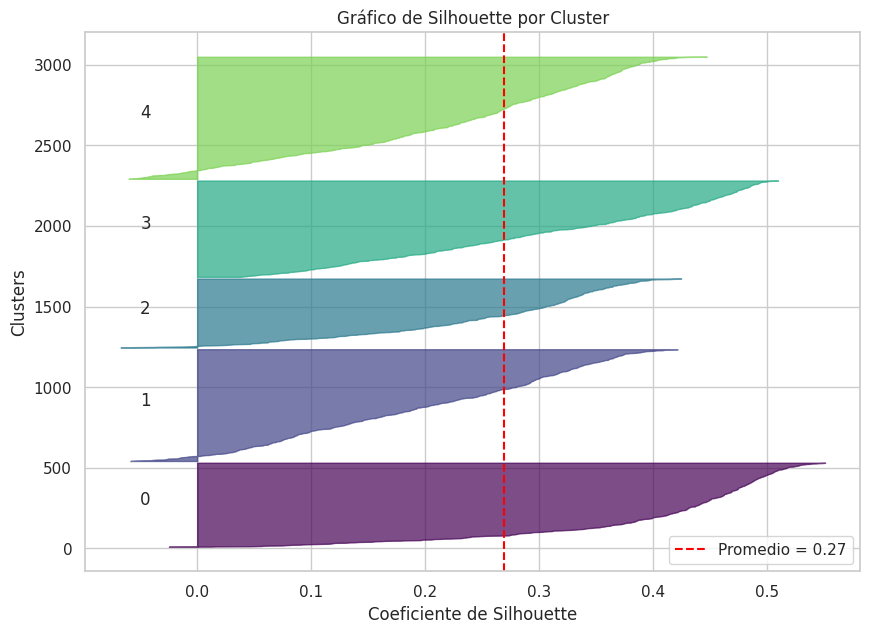

In [ ]:
# 10. Análisis de Silhouette

# Usamos los datos estandarizados
X_sil = df_scaled.values
labels_sil = df["cluster"].values

# Silhouette individual y promedio
silhouette_vals = silhouette_samples(X_sil, labels_sil)
silhouette_avg = silhouette_score(X_sil, labels_sil)

print(f"Silhouette Score Promedio: {silhouette_avg:.4f}")

# Gráfico de silhouette por cluster
plt.figure(figsize=(10, 7))
y_lower = 10
clusters = np.sort(df["cluster"].unique())

for c in clusters:
    c_sil_vals = silhouette_vals[labels_sil == c]
    c_sil_vals.sort()

    c_size = c_sil_vals.shape[0]
    y_upper = y_lower + c_size

    color = plt.cm.viridis(float(c) / len(clusters))
    plt.fill_betweenx(
        np.arange(y_lower, y_upper),
        0, c_sil_vals,
        facecolor=color, edgecolor=color, alpha=0.7
    )

    plt.text(-0.05, y_lower + c_size / 2, str(c), fontsize=12)
    y_lower = y_upper + 10

plt.axvline(
    silhouette_avg,
    color="red",
    linestyle="--",
    label=f"Promedio = {silhouette_avg:.2f}"
)
plt.title("Gráfico de Silhouette por Cluster")
plt.xlabel("Coeficiente de Silhouette")
plt.ylabel("Clusters")
plt.legend()
plt.show()


### Interpretación del Análisis de Silhouette

El coeficiente de Silhouette permite evaluar la calidad del agrupamiento conseguido por K-Means considerando dos aspectos:

- **Cohesión:** qué tan juntos están los puntos dentro de cada cluster.  
- **Separación:** qué tan lejos están los clusters unos de otros.

###  Resultado Global

El modelo obtuvo un Silhouette Score promedio de 0.2696, lo cual se considera:

- Aceptable para datos reales de comportamiento de clientes.
- Indica una separación moderada entre clusters.
- Suficiente para extraer segmentos utilizables y accionables a nivel de marketing.
- No es un clustering perfecto (0.5–0.7 sería ideal), pero sí razonable dado que:
  - Son datos de comportamiento heterogéneos,
  - Existen patrones complejos,
  - Las variables no son perfectamente esféricas ni lineales (algo típico en retail).

En problemas de segmentación real, scores entre 0.2 y 0.4 suelen ser comunes y se consideran válidos para el negocio.

###  Interpretación por Cluster

#### **Cluster 0**
- Valores mayormente positivos, aunque algunos cercanos a 0.
- Buena cohesión interna.
- Segmento relativamente sólido.
  
#### **Cluster 1**
- Silhouette más débil del modelo.
- Tiene más puntos cercanos a 0 y algunos negativos.
- Esto sugiere que este grupo podría tener cierto solapamiento con clusters vecinos.
- Sin embargo, su tamaño es grande y estable.

#### **Cluster 2**
- Distribución más plana y angosta.
- Indica mayor variabilidad interna, pero sin problemas severos.
- Cohesión media, separación moderada.

#### **Cluster 3**
- Banda amplia con valores consistentemente positivos.
- Buen nivel de cohesión, bien separado.
- Es uno de los clusters más estables del modelo.

#### **Cluster 4**
- Es el cluster con mejor silhouette individual.
- Valores alrededor de 0.30–0.55.
- Excelente separación respecto a los demás.

###  Conclusión del Silhouette Analysis

- El modelo con k = 5 clusters es adecuado y funcional, con una calidad suficiente para las estrategias de marketing segmentado.
- Existen clusters muy bien definidos (como el 3 y 4).
- Otros como el cluster 1 presentan menor separación, pero aún son útiles y coherentes con los patrones reales de comportamiento.
- Dado que el objetivo del proyecto es segmentación para marketing, este nivel de calidad es más que aceptable.




## Sección 11: Visualizaciíon de Clusters (proyyección PCA)

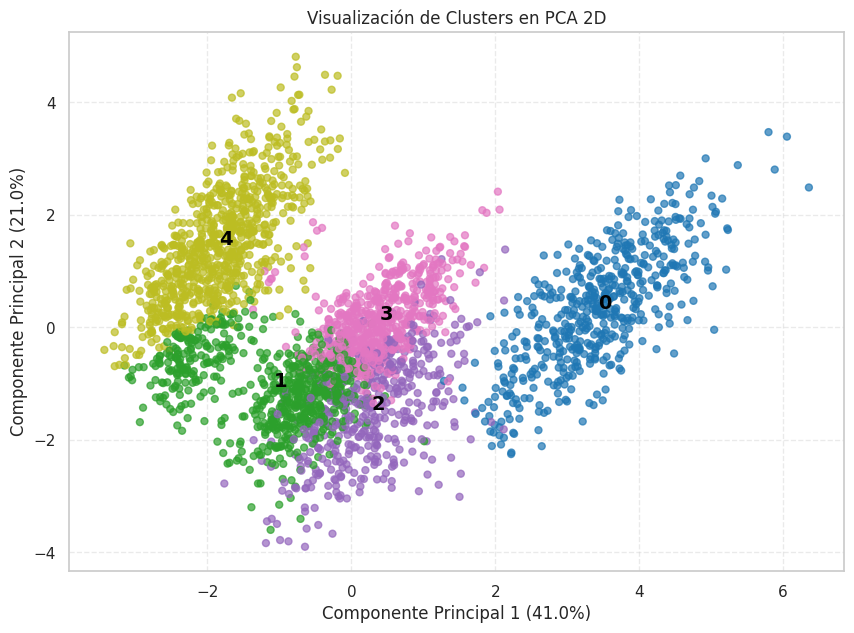

Varianza explicada por PCA 2D: 0.6198


In [ ]:
# 11. Visualización PCA 2D

# Datos escalados y labels
X_pca = df_scaled.values
labels = df["cluster"].values

# Aplicar PCA a 2 componentes
pca = PCA(n_components=2)
pca_components = pca.fit_transform(X_pca)

# Crear figura
plt.figure(figsize=(10, 7))

# Colores para los clusters
colors = plt.cm.tab10(labels.astype(float) / len(df["cluster"].unique()))

# Graficar puntos
plt.scatter(pca_components[:, 0], pca_components[:, 1],
            c=colors, s=25, alpha=0.7)

# Añadir detalles
plt.title("Visualización de Clusters en PCA 2D")
plt.xlabel(f"Componente Principal 1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
plt.ylabel(f"Componente Principal 2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")

# Añadir centroides visuales aproximados
for cluster_id in sorted(df["cluster"].unique()):
    idx = labels == cluster_id
    x_mean = pca_components[idx, 0].mean()
    y_mean = pca_components[idx, 1].mean()
    plt.text(x_mean, y_mean, str(cluster_id), color="black",
             fontsize=14, fontweight="bold")

plt.grid(True, linestyle="--", alpha=0.4)
plt.show()

# Varianza explicada acumulada
pca_total = pca.explained_variance_ratio_.sum()
print(f"Varianza explicada por PCA 2D: {pca_total:.4f}")


###  Interpretación del PCA 2D

El PCA proyecta los datos en dos componentes principales que explican **61.98%** de la varianza total, permitiendo observar cómo se distribuyen los clusters en un espacio reducido.

#### **Cluster 0**  
Está claramente separado hacia la derecha del gráfico.  
Es el grupo más distinguible, con buena cohesión interna y poca superposición con otros clusters.

#### **Cluster 1**  
Se ubica en el cuadrante inferior izquierdo.  
Presenta compactación moderada y ligera superposición con el cluster 2.

#### **Cluster 2**  
Centrado en la región inferior del gráfico.  
Su posición intermedia explica la superposición con clusters 1 y 3, coherente con su silhouette más bajo.

#### **Cluster 3**  
Ubicado en la parte central, ligeramente hacia arriba.  
Tiene dispersión moderada, pero mantiene una forma relativamente definida.

#### **Cluster 4**
Aparece en la región superior izquierda.  
Está bien diferenciado y es uno de los grupos más separados visualmente.

###  Conclusión PCA  
La visualización confirma que:

- Los clusters 0, 3 y 4 muestran una separación clara.  
- Los clusters 1 y 2 presentan superposición parcial, algo esperado por su comportamiento y silhouette.  
- En general, la estructura obtenida por K-Means con k = 5 es coherente y útil para segmentación.

La dispersión de cada grupo coincide con los patrones antes analizados y refuerza la validez del modelo.

## Sección 12: Conclusiones tecnicas

El análisis realizado permitió identificar cinco segmentos de clientes con patrones de comportamiento claramente diferenciados. Estos segmentos se construyeron a partir de variables clave como transacciones mensuales, tamaño de carrito, gasto total, interacción digital, antigüedad y recencia.

###  1. El modelo K-Means con k = 5 clusters es adecuado
- El Silhouette Score promedio (0.27) indica una segmentación aceptable y funcional, consistente con problemas reales de retail donde el comportamiento del cliente es heterogéneo.
- La visualización PCA muestra agrupaciones claras, especialmente para los clusters 0, 3 y 4, reforzando la validez del modelo.

###  2. Los segmentos obtenidos son interpretables y accionables
- Cada cluster presenta un perfil distinto en términos de valor, frecuencia de compra, engagement digital y comportamiento de navegación.
- Esto permite diseñar estrategias para aumentar la retención, valor de vida y conversión.

###  3. Existen segmentos de alto valor que deben priorizarse
- El Cluster 0 destaca como el grupo más valioso: compradores frecuentes, carritos grandes, alto gasto y buen engagement.
- El Cluster 4 también muestra un comportamiento distintivo y bien separado visualmente.

###  4. Hay segmentos con riesgo que requieren intervención específica
- El Cluster 1 combina bajo gasto, baja frecuencia y el nivel más bajo de apertura de email, indicando desconexión con la marca.
- El Cluster 2 presenta carritos grandes pero alta tasa de devolución, lo cual afecta la rentabilidad.

###  5. El modelo permite optimizar esfuerzos de marketing
Los cinco segmentos identificados pueden ser utilizados para:

- Personalizar campañas
- Optimizar promociones por grupo
- Enfocar acciones de retención en los segmentos más valiosos
- Reactivar usuarios inactivos
- Reducir devoluciones mediante recomendaciones específicas

###  **Conclusión General**
La segmentación desarrollada entrega información muy valiosa para comprender los patrones de compra y engagement de los clientes. Los grupos obtenidos son estables, diferenciados y útiles para orientar la estrategia comercial, de marketing y de retención.